# Linear Regression

In [1]:
# pandas ------------- To work with data frame
import time
start_time=time.time()
import pandas as pd
# numpy ------------- To work with numerical computations
import numpy as np
# sklearn ----------- Package to split data into train&test
from sklearn.model_selection import train_test_split
# sklearn ---------- Package to use linear regression
from sklearn.linear_model import LinearRegression
# sklearn ---------- Package to Standardize data => z=(xi-mu)/sigma
from sklearn.preprocessing import StandardScaler
#sklearn ------------ Package for performance metric
from sklearn.metrics import mean_squared_error
# seaborn ----------- Package for visualization
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels.formula.api as smf

# Importing data

In [2]:
import os 
os.getcwd()

'C:\\Users\\upend\\Desktop\\SKILL-LYNC\\MACHINE_LEARNING\\skill-lync-Ml\\week7'

In [3]:
data=pd.read_csv('C:\\Users\\upend\\Desktop\\SKILL-LYNC\\MACHINE_LEARNING\\skill-lync-Ml\\week7\\pmsm_temperature_data.csv')

# Exploratory data analysis

In [4]:
data.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4


In [5]:
data.tail()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
998065,-0.047497,0.341638,0.331475,-1.246114,-1.222428,-0.25564,1.029142,-0.245723,0.429853,1.018568,0.836084,0.494725,72
998066,-0.048839,0.320022,0.331701,-1.250655,-1.222437,-0.25564,1.029148,-0.245736,0.429751,1.013416,0.834438,0.494279,72
998067,-0.042350,0.307415,0.330946,-1.246852,-1.222430,-0.25564,1.029191,-0.245701,0.429439,1.002906,0.833936,0.492666,72
998068,-0.039433,0.302082,0.330987,-1.249505,-1.222432,-0.25564,1.029147,-0.245727,0.429558,0.999157,0.830504,0.490581,72
998069,-0.043803,0.312666,0.330830,-1.246590,-1.222431,-0.25564,1.029141,-0.245722,0.429166,0.987163,0.828046,0.489382,72


In [6]:
data.info()       # To get data information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 998070 entries, 0 to 998069
Data columns (total 13 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   ambient         998070 non-null  float64
 1   coolant         998070 non-null  float64
 2   u_d             998070 non-null  float64
 3   u_q             998070 non-null  float64
 4   motor_speed     998070 non-null  float64
 5   torque          998070 non-null  float64
 6   i_d             998070 non-null  float64
 7   i_q             998070 non-null  float64
 8   pm              998070 non-null  float64
 9   stator_yoke     998070 non-null  float64
 10  stator_tooth    998070 non-null  float64
 11  stator_winding  998070 non-null  float64
 12  profile_id      998070 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 99.0 MB


In [7]:
data.isnull().sum() # checking missing values

ambient           0
coolant           0
u_d               0
u_q               0
motor_speed       0
torque            0
i_d               0
i_q               0
pm                0
stator_yoke       0
stator_tooth      0
stator_winding    0
profile_id        0
dtype: int64

In [8]:
data.describe()       # To get 5 number summary and counts

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
count,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000,998070.000000
mean,-0.003905,0.004723,0.004780,-0.005690,-0.006336,-0.003333,0.006043,-0.003194,-0.004396,0.000609,-0.002208,-0.003935,50.732001
std,0.993127,1.002423,0.997878,1.002330,1.001229,0.997907,0.998994,0.997912,0.995686,1.001049,0.999597,0.998343,22.073125
min,-8.573954,-1.429349,-1.655373,-1.861463,-1.371529,-3.345953,-3.245874,-3.341639,-2.631991,-1.834688,-2.066143,-2.019973,4.000000
25%,-0.599385,-1.037925,-0.826359,-0.927390,-0.951892,-0.266917,-0.756296,-0.257269,-0.672308,-0.747265,-0.761951,-0.725622,32.000000
50%,0.266157,-0.177187,0.267542,-0.099818,-0.140246,-0.187246,0.213935,-0.190076,0.094367,-0.057226,0.005085,0.006536,56.000000
75%,0.686675,0.650709,0.358491,0.852625,0.853584,0.547171,1.013975,0.499260,0.680691,0.697344,0.772239,0.725660,68.000000
max,2.967117,2.649032,2.274734,1.793498,2.024164,3.016971,1.060937,2.914185,2.917456,2.449158,2.326668,2.653781,81.000000


In [9]:
data.columns

Index(['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'torque', 'i_d',
       'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding',
       'profile_id'],
      dtype='object')

In [10]:
data.shape

(998070, 13)

In [11]:
data.value_counts()

ambient    coolant    u_d        u_q        motor_speed  torque     i_d        i_q        pm         stator_yoke  stator_tooth  stator_winding  profile_id
-8.573954  -1.429349  -1.190418   0.682727   0.130298     0.998207  -0.107606   1.039440  -0.620771  -0.532281    -0.453628     -0.477930       44            1
 0.590822  -0.698530   0.348319  -1.300498  -1.222430    -0.255640   1.029141  -0.245731  -1.118372  -1.409104    -1.674346     -1.659833       67            1
 0.590777  -0.691495   0.348333  -1.299540  -1.222428    -0.255640   1.029151  -0.245703  -0.350135  -0.986576    -1.120477     -1.122621       67            1
 0.590780  -0.686418   0.346242  -1.299119  -1.222433    -0.255640   1.029164  -0.245718  -0.348111  -0.977739    -1.111880     -1.112979       67            1
            0.112671  -0.357780   0.046633  -0.509881     0.653342   0.630711   0.786634   0.675708   1.705511     1.977593      1.819471       57            1
                                             

# Finding Outliers

In [12]:
def findout_outliers(data,col_name):
    global Q3,Q1,IQR_median,lower_bound,upper_bound
    Q1=data[col_name].quantile(.25)
    Q3=data[col_name].quantile(.75)
    IQR_median=(Q3-Q1)
    lower_bound=Q1-1.5*IQR_median
    upper_bound=Q3+1.5*IQR_median
    return ((data[col_name]<lower_bound) | (data[col_name]>upper_bound)).sum()
print("="*50)
print("pmsm_temperature_data DataFrame:")
print("pmsm_temperature_data with ambient:",findout_outliers(data,'ambient'))
print("pmsm_temperature_data with coolant:",findout_outliers(data,'coolant'))
print("pmsm_temperature_data with u_d:",findout_outliers(data,'u_d'))
print("pmsm_temperature_data with u_q:",findout_outliers(data,'u_q'))
print("pmsm_temperature_data with motor_speed:",findout_outliers(data,'motor_speed'))
print("pmsm_temperature_data with torque :",findout_outliers(data,'torque'))
print("pmsm_temperature_data with i_d :",findout_outliers(data,'i_d'))
print("pmsm_temperature_data with i_q:",findout_outliers(data,'i_q'))
print("pmsm_temperature_data with pm :",findout_outliers(data,'pm'))
print("pmsm_temperature_data with stator_yoke:",findout_outliers(data,'stator_yoke'))
print("pmsm_temperature_data with stator_tooth  :",findout_outliers(data,'stator_tooth'))
print("pmsm_temperature_data with stator_winding :",findout_outliers(data,'stator_winding'))
print("pmsm_temperature_data with profile_id:",findout_outliers(data,'profile_id'))

pmsm_temperature_data DataFrame:
pmsm_temperature_data with ambient: 38492
pmsm_temperature_data with coolant: 0
pmsm_temperature_data with u_d: 18050
pmsm_temperature_data with u_q: 0
pmsm_temperature_data with motor_speed: 0
pmsm_temperature_data with torque : 127303
pmsm_temperature_data with i_d : 0
pmsm_temperature_data with i_q: 148535
pmsm_temperature_data with pm : 1501
pmsm_temperature_data with stator_yoke: 0
pmsm_temperature_data with stator_tooth  : 0
pmsm_temperature_data with stator_winding : 0
pmsm_temperature_data with profile_id: 0


<Axes: xlabel='ambient', ylabel='Density'>

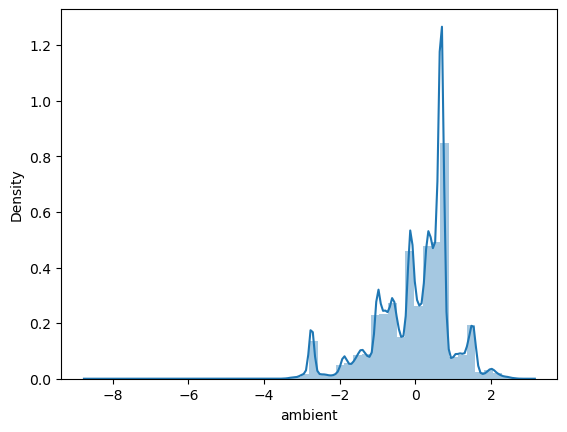

In [13]:
import warnings
warnings.filterwarnings("ignore")
sns.distplot(data['ambient'])

<Axes: >

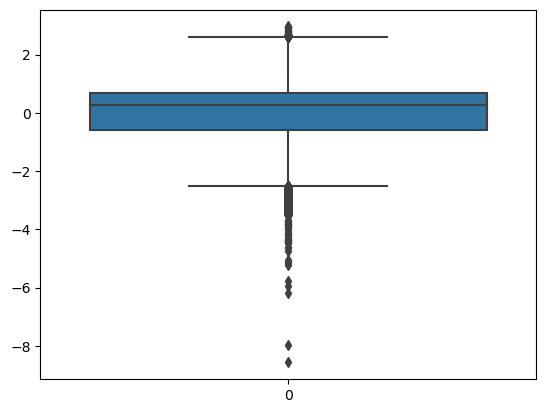

In [14]:
# To see the outliers clearly
sns.boxplot(data['ambient'])

# Removing  outliers using z- score method

In [15]:
# Finding limits
upper_limit=data['ambient'].mean()+3*data['ambient'].std()
lower_limit=data['ambient'].mean()-3*data['ambient'].std()
print(upper_limit)
print(lower_limit)

2.9754748544789025
-2.9832858386380345


In [16]:
# finding the outliers
data.loc[(data['ambient'] >upper_limit) | (data['ambient']<lower_limit)]

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
36414,-3.698899,-1.288667,-1.126325,0.746681,1.483029,0.350814,-1.078798,0.304409,0.142141,-0.702812,-0.224093,0.016168,6
176553,-2.991266,-1.066911,0.081503,-1.048000,-1.141286,3.009333,-1.512040,2.914150,-2.486858,-1.201444,-0.831287,0.104254,29
176554,-2.997300,-1.067965,0.081445,-1.047995,-1.141279,3.009294,-1.512048,2.914152,-2.487006,-1.192994,-0.828234,0.121832,29
176555,-3.019048,-1.069387,0.081384,-1.047946,-1.141269,3.009282,-1.512048,2.914150,-2.485686,-1.184365,-0.824580,0.139701,29
176556,-3.050989,-1.070606,0.081410,-1.047886,-1.141270,3.009099,-1.512044,2.914150,-2.483715,-1.176446,-0.821994,0.157295,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...
947781,-4.605808,-0.285341,0.976199,0.125573,-0.400140,-1.079422,0.698533,-1.181092,0.222926,0.226364,0.028790,-0.118461,80
947782,-3.541268,-0.086023,0.971248,0.126169,-0.402308,-1.072029,0.708159,-1.174448,0.223407,0.227100,0.027512,-0.120641,80
989728,-4.401607,-0.993057,1.006816,1.239116,1.941937,-0.609125,-0.938995,-0.572928,0.384277,-0.734715,-0.761953,-0.723739,72
989729,-5.239872,-1.078828,0.781064,1.368994,1.937356,-0.512008,-0.865224,-0.484981,0.375969,-0.734718,-0.761952,-0.719982,72


In [17]:
# trimming ---------- delete the outlier data
new_df1=data.loc[(data['ambient'] <= upper_limit) & (data['ambient'] >= lower_limit)]
print('Before removing outliers:',len(data))
print('After removing outliers:',len(new_df1))
print('Outliers:',len(data)-len(new_df1))

Before removing outliers: 998070
After removing outliers: 995310
Outliers: 2760


<Axes: >

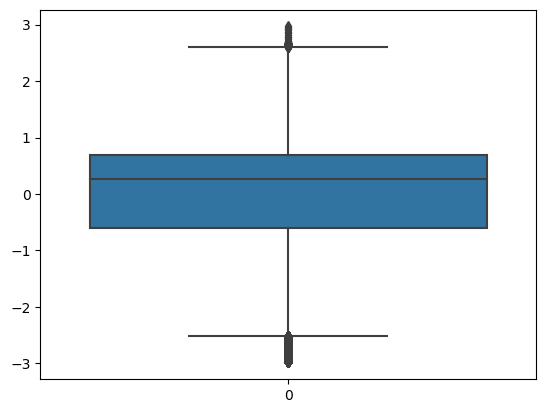

In [18]:
sns.boxplot(new_df1['ambient'])

# IQR method removing outlieres

In [19]:
q1=data['u_d'].quantile(0.25)
q3=data['u_d'].quantile(0.75)
iqr=q3-q1

In [20]:
q1,q3,iqr

(-0.826358675, 0.35849101499999997, 1.18484969)

In [21]:
upper_limit=q3+(1.5*iqr)
lower_limit=q1-(1.5*iqr)
lower_limit,upper_limit

(-2.60363321, 2.13576555)

<Axes: >

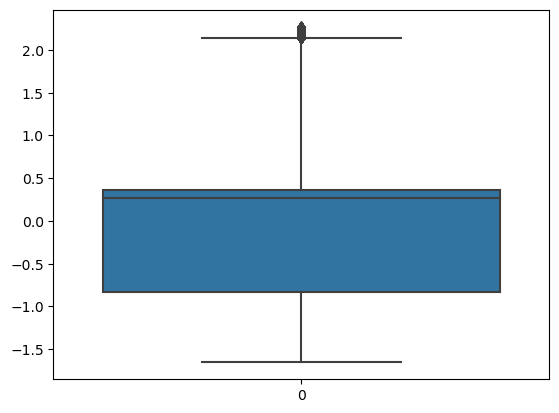

In [22]:
sns.boxplot(data['u_d'])

In [23]:
# finding the outliers
data.loc[(data['u_d'] >upper_limit) | (data['u_d']<lower_limit)]

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
64736,0.628812,-1.093607,2.136398,-0.225596,0.130189,-2.163762,-1.041714,-2.033102,-0.168503,-0.734725,-0.378472,-0.134092,6
64737,0.602934,-1.094093,2.170266,-0.380823,0.130216,-2.257430,-1.253643,-2.091590,-0.168295,-0.734725,-0.380882,-0.137452,6
64738,0.581923,-1.094438,2.195563,-0.513971,0.130212,-2.330242,-1.433803,-2.137483,-0.167909,-0.734725,-0.378922,-0.141852,6
64739,0.566245,-1.094755,2.213260,-0.816370,0.130180,-2.448615,-1.848000,-2.203644,-0.167770,-0.734725,-0.375385,-0.144500,6
64740,0.550532,-1.094865,2.223093,-1.096762,0.130212,-2.551276,-2.231323,-2.257275,-0.167677,-0.734725,-0.376981,-0.145388,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
995572,-0.125369,-0.694749,2.157517,-0.262236,0.215438,-2.084759,-1.194527,-1.964013,-0.853701,-0.934384,-0.892307,-0.775074,72
995573,-0.126122,-0.691640,2.149183,-0.216057,0.218144,-2.057057,-1.136185,-1.944925,-0.862079,-0.930755,-0.890498,-0.777150,72
995580,-0.119163,-0.691465,2.142258,-0.165750,0.127612,-2.140943,-0.973410,-2.055133,-0.858825,-0.918070,-0.880214,-0.745892,72
995581,-0.121675,-0.693655,2.147950,-0.184520,0.142290,-2.134615,-1.014668,-2.042113,-0.862848,-0.918320,-0.877632,-0.740241,72


In [24]:
# trimming ---------- delete the outlier data
new_df1=data.loc[(data['u_d'] < upper_limit) & (data['u_d'] > lower_limit)]
print('Before removing outliers:',len(data))
print('After removing outliers:',len(new_df1))
print('Outliers:',len(data)-len(new_df1))

Before removing outliers: 998070
After removing outliers: 980020
Outliers: 18050


<Axes: >

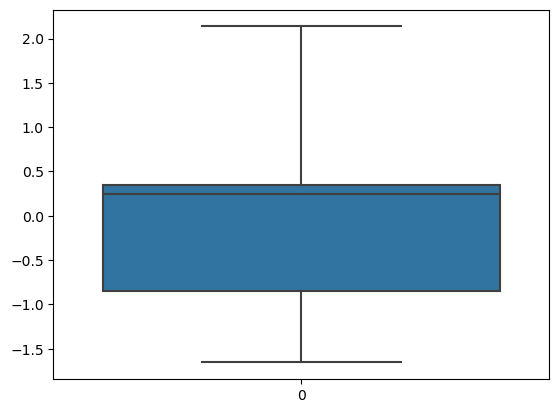

In [25]:
sns.boxplot(new_df1['u_d'])

In [26]:
# capping - change the outlier values to upper (or) lower limit values
new_df1=data.copy()
new_df1.loc[new_df1['u_d']>upper_limit,'u_d']=upper_limit
new_df1.loc[new_df1['u_d']<lower_limit,'u_d']=lower_limit

<Axes: >

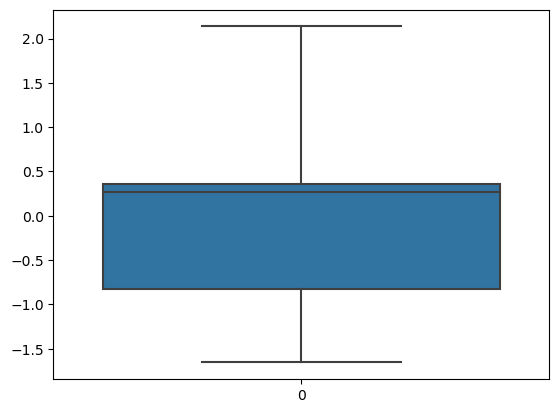

In [27]:
sns.boxplot(new_df1['u_d'])

<Axes: xlabel='torque', ylabel='Density'>

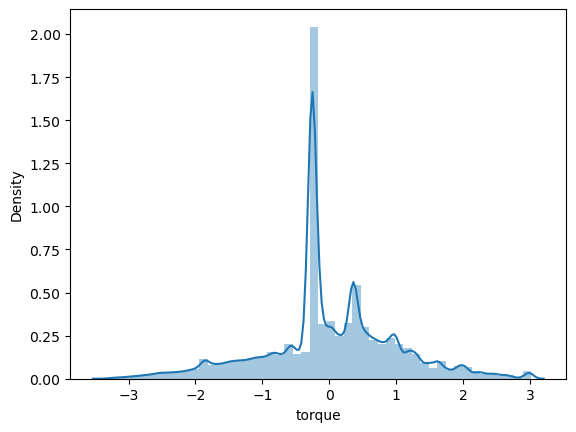

In [28]:
import warnings
warnings.filterwarnings("ignore")
sns.distplot(data['torque'])

<Axes: >

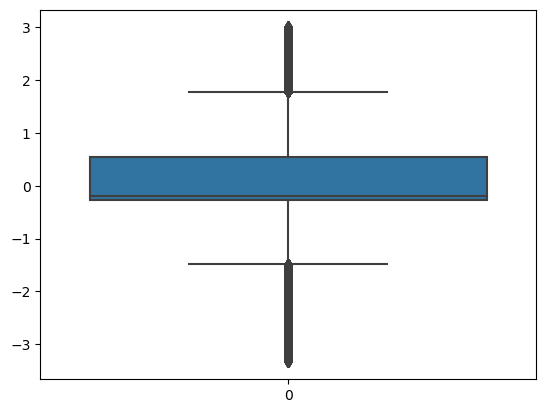

In [29]:
sns.boxplot(data['torque'])

# Percentile Method

In [30]:
upper_limit=data['torque'].quantile(0.99)
lower_limit=data['torque'].quantile(0.01)
print('upper limit',upper_limit)
print('lower limit',lower_limit)

upper limit 2.5655143
lower limit -2.597936528


In [31]:
# finding the outliers
data.loc[(data['torque'] >upper_limit) | (data['torque']<lower_limit)]

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
64741,0.526723,-1.094632,2.229248,-1.306346,0.130239,-2.625048,-2.516463,-2.294987,-0.167411,-0.734725,-0.380569,-0.144252,6
64742,0.510009,-1.094106,2.233165,-1.456910,0.130255,-2.677349,-2.720804,-2.321938,-0.166915,-0.734725,-0.381356,-0.135978,6
64743,0.497363,-1.092646,2.235167,-1.568207,0.130266,-2.714911,-2.871573,-2.340899,-0.166458,-0.734725,-0.379925,-0.130108,6
64744,0.481564,-1.091449,2.237804,-1.643762,0.130275,-2.741538,-2.973879,-2.354962,-0.165863,-0.734725,-0.380673,-0.125173,6
64745,0.468676,-1.088488,2.239151,-1.698527,0.130280,-2.760591,-3.047929,-2.364886,-0.165161,-0.734725,-0.381963,-0.118488,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
994035,-0.117829,-0.698406,1.389147,-0.789963,-0.622902,-2.846123,-0.777826,-2.870112,-0.835546,-0.968204,-0.945208,-0.679960,72
994036,-0.118689,-0.696579,1.387019,-0.804266,-0.627472,-2.873883,-0.806240,-2.896254,-0.821163,-0.966140,-0.940600,-0.675241,72
994037,-0.119305,-0.695270,1.371537,-0.826837,-0.639177,-2.904138,-0.835118,-2.925147,-0.819518,-0.963566,-0.932645,-0.666743,72
994038,-0.119631,-0.693644,1.288794,-0.879386,-0.684615,-2.923312,-0.854366,-2.943233,-0.840267,-0.961722,-0.927125,-0.661936,72


In [32]:
# trimming ---------- delete the outlier data
new_df1=data.loc[(data['torque'] <= upper_limit) & (data['torque'] >= lower_limit)]
print('Before removing outliers:',len(data))
print('After removing outliers:',len(new_df1))
print('Outliers:',len(data)-len(new_df1))

Before removing outliers: 998070
After removing outliers: 978588
Outliers: 19482


<Axes: >

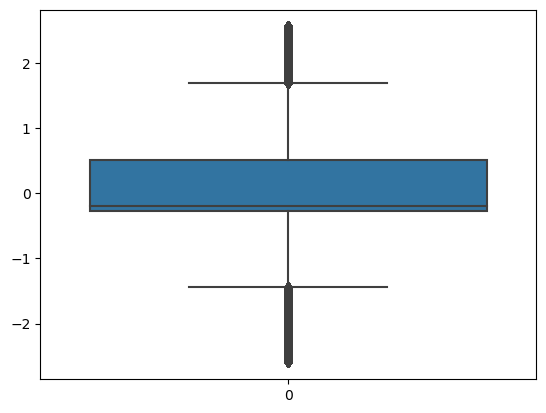

In [33]:
sns.boxplot(new_df1['torque'])

<Axes: >

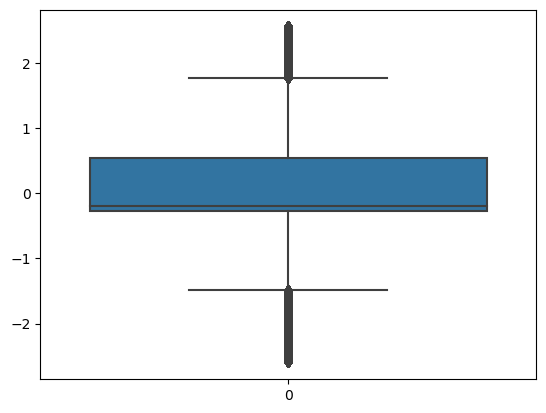

In [34]:
# capping - change the outlier values to upper (or) lower limit values
new_df1=data.copy()
new_df1.loc[new_df1['torque']>=upper_limit,'torque']=upper_limit
new_df1.loc[new_df1['torque']<=lower_limit,'torque']=lower_limit
sns.boxplot(new_df1['torque'])

<Axes: xlabel='i_q', ylabel='Density'>

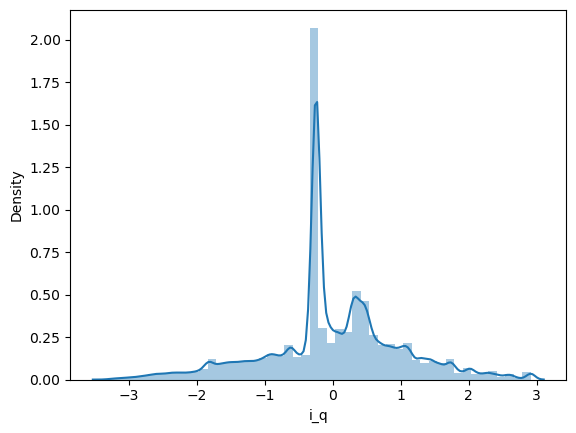

In [35]:
import warnings
warnings.filterwarnings("ignore")
sns.distplot(data['i_q'])

<Axes: >

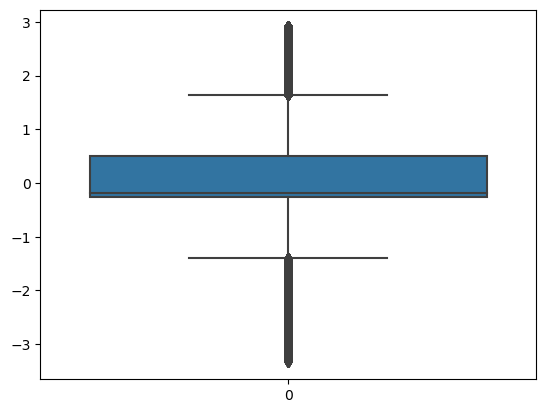

In [36]:
sns.boxplot(data['i_q'])

# Removing outliers using z-score method

In [37]:
# Finding limits
upper_limit=data['i_q'].mean()+3*data['i_q'].std()
lower_limit=data['i_q'].mean()-3*data['i_q'].std()
print(upper_limit)
print(lower_limit)

2.990542425934799
-2.996930457067382


In [38]:
# finding the outliers
data.loc[(data['i_q'] >upper_limit) | (data['i_q']<lower_limit)]

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
414925,0.418942,0.355760,1.904600,-0.616307,-0.364672,-3.006279,-0.946209,-3.019520,-0.785274,0.213464,0.155684,0.233898,51
414926,0.407425,0.355655,1.926589,-0.613620,-0.356167,-3.019331,-0.956294,-3.032396,-0.751130,0.214138,0.155747,0.242914,51
414927,0.400074,0.354768,1.980443,-0.585029,-0.328063,-3.017324,-0.950686,-3.031414,-0.777375,0.213488,0.155792,0.250209,51
414928,0.389012,0.354246,2.064184,-0.535538,-0.281536,-3.006908,-0.939528,-3.021928,-0.793778,0.214299,0.156421,0.255436,51
415460,0.317598,0.352690,0.738555,-1.214400,-0.978944,-3.048141,-0.987300,-3.061335,-0.602041,0.465531,0.436110,0.455271,51
...,...,...,...,...,...,...,...,...,...,...,...,...,...
994023,-0.134892,-0.692566,1.507929,-0.877006,-0.597270,-3.154196,-1.104490,-3.158629,-0.763949,-0.990861,-1.057998,-0.765438,72
994024,-0.133454,-0.694313,1.479596,-0.859521,-0.604321,-3.087516,-1.033591,-3.096075,-0.777315,-0.989543,-1.050687,-0.754331,72
994025,-0.132423,-0.696032,1.449657,-0.849394,-0.613750,-3.034136,-0.977218,-3.046051,-0.800899,-0.988997,-1.040390,-0.746105,72
994026,-0.131800,-0.697333,1.427241,-0.849255,-0.622744,-3.010668,-0.951454,-3.024142,-0.824369,-0.987262,-1.021041,-0.738868,72


In [39]:
# trimming ---------- delete the outlier data
new_df1=data.loc[(data['i_q'] <= upper_limit) & (data['i_q'] >= lower_limit)]
print('Before removing outliers:',len(data))
print('After removing outliers:',len(new_df1))
print('Outliers:',len(data)-len(new_df1))

Before removing outliers: 998070
After removing outliers: 995499
Outliers: 2571


<Axes: >

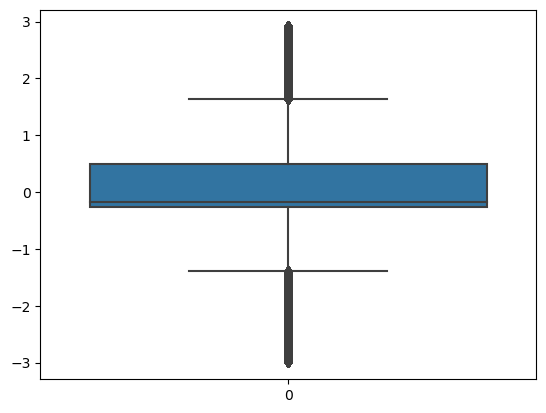

In [40]:
sns.boxplot(new_df1['i_q'])

<Axes: >

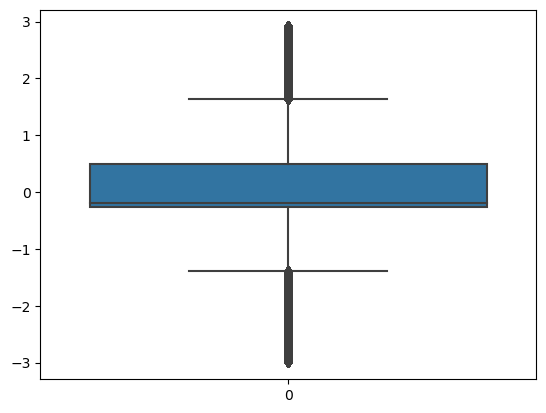

In [41]:
# capping - change the outlier values to upper (or) lower limit values
new_df1=data.copy()
new_df1.loc[new_df1['i_q']>=upper_limit,'i_q']=upper_limit
new_df1.loc[new_df1['i_q']<=lower_limit,'i_q']=lower_limit
sns.boxplot(new_df1['i_q'])

# Preaparing Model

In [42]:
data.columns

Index(['ambient', 'coolant', 'u_d', 'u_q', 'motor_speed', 'torque', 'i_d',
       'i_q', 'pm', 'stator_yoke', 'stator_tooth', 'stator_winding',
       'profile_id'],
      dtype='object')

In [43]:
#Build model
import statsmodels.formula.api as smf
model = smf.ols('motor_speed~ambient+coolant+u_d+u_q+motor_speed+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit()

In [44]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            motor_speed   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.232e+33
Date:                Mon, 06 May 2024   Prob (F-statistic):               0.00
Time:                        12:20:17   Log-Likelihood:             3.0992e+07
No. Observations:              998070   AIC:                        -6.198e+07
Df Residuals:                  998056   BIC:                        -6.198e+07
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       9.714e-16    2.4e-17     40.497      0.000    9.24e-16    1.02e-15
ambient         1.648e-16   1.05e-17     15.764      0.000    1.44e-16    1.85e-16
coolant         2.748e-15    5.1e-17     53.861      0.000    2.65e-15    2.85e-15
u_d            -1.249e-15   1.78e-17    -70.240      0.000   -1.28e-15   -1.21e-15
u_q              1.61e-15   1.87e-17     86.308      0.000    1.57e-15    1.65e-15
motor_speed        1.0000   2.95e-17   3.39e+16      0.000       1.000       1.000
torque         -1.527e-15   1.26e-16    -12.131      0.000   -1.77e-15   -1.28e-15
i_d             -1.11e-16   2.36e-17     -4.695      0.000   -1.57e-16   -6.47e-17
i_q             2.118e-15   1.18e-16     17.883      0.000    1.89e-15    2.35e-15
pm              6.696e-16   1.67e-17     40.053      0.000    6.37e-16    7.02e-16
stator_yoke    -9.104e-15   1.59e-16    -57.158      0.000   -9.42e-15   -8.79e-15
stator_tooth    3.109e-15   2.12e-16     14.669      0.000    2.69e-15    3.52e-15
stator_winding -3.442e-15   1.05e-16    -32.745      0.000   -3.65e-15   -3.24e-15
profile_id     -1.209e-17   4.47e-19    -27.051      0.000    -1.3e-17   -1.12e-17
==============================================================================
Omnibus:                    75788.381   Durbin-Watson:                   0.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25108.970
Skew:                          -0.021   Prob(JB):                         0.00
Kurtosis:                       2.224   Cond. No.                     1.93e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [45]:
#coefficients
model.params

Intercept         9.714451e-16
ambient           1.647987e-16
coolant           2.747802e-15
u_d              -1.249001e-15
u_q               1.609823e-15
motor_speed       1.000000e+00
torque           -1.526557e-15
i_d              -1.110223e-16
i_q               2.118097e-15
pm                6.696033e-16
stator_yoke      -9.103829e-15
stator_tooth      3.108624e-15
stator_winding   -3.441691e-15
profile_id       -1.208885e-17
dtype: float64

In [46]:
# t and p-values
print(model.tvalues,'\n',model.pvalues)

Intercept         4.049662e+01
ambient           1.576448e+01
coolant           5.386099e+01
u_d              -7.023966e+01
u_q               8.630833e+01
motor_speed       3.394530e+16
torque           -1.213136e+01
i_d              -4.695270e+00
i_q               1.788342e+01
pm                4.005342e+01
stator_yoke      -5.715813e+01
stator_tooth      1.466894e+01
stator_winding   -3.274497e+01
profile_id       -2.705074e+01
dtype: float64 
 Intercept          0.000000e+00
ambient            5.547875e-56
coolant            0.000000e+00
u_d                0.000000e+00
u_q                0.000000e+00
motor_speed        0.000000e+00
torque             7.243948e-34
i_d                2.662906e-06
i_q                1.629477e-71
pm                 0.000000e+00
stator_yoke        0.000000e+00
stator_tooth       1.031267e-48
stator_winding    4.777661e-235
profile_id        4.281997e-161
dtype: float64


In [47]:
# R squared values
(model.rsquared,model.rsquared_adj)

(1.0, 1.0)

In [48]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            motor_speed   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.232e+33
Date:                Mon, 06 May 2024   Prob (F-statistic):               0.00
Time:                        12:20:18   Log-Likelihood:             3.0992e+07
No. Observations:              998070   AIC:                        -6.198e+07
Df Residuals:                  998056   BIC:                        -6.198e+07
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       9.714e-16    2.4e-17     40.497      0.000    9.24e-16    1.02e-15
ambient         1.648e-16   1.05e-17     15.764      0.000    1.44e-16    1.85e-16
coolant         2.748e-15    5.1e-17     53.861      0.000    2.65e-15    2.85e-15
u_d            -1.249e-15   1.78e-17    -70.240      0.000   -1.28e-15   -1.21e-15
u_q              1.61e-15   1.87e-17     86.308      0.000    1.57e-15    1.65e-15
motor_speed        1.0000   2.95e-17   3.39e+16      0.000       1.000       1.000
torque         -1.527e-15   1.26e-16    -12.131      0.000   -1.77e-15   -1.28e-15
i_d             -1.11e-16   2.36e-17     -4.695      0.000   -1.57e-16   -6.47e-17
i_q             2.118e-15   1.18e-16     17.883      0.000    1.89e-15    2.35e-15
pm              6.696e-16   1.67e-17     40.053      0.000    6.37e-16    7.02e-16
stator_yoke    -9.104e-15   1.59e-16    -57.158      0.000   -9.42e-15   -8.79e-15
stator_tooth    3.109e-15   2.12e-16     14.669      0.000    2.69e-15    3.52e-15
stator_winding -3.442e-15   1.05e-16    -32.745      0.000   -3.65e-15   -3.24e-15
profile_id     -1.209e-17   4.47e-19    -27.051      0.000    -1.3e-17   -1.12e-17
==============================================================================
Omnibus:                    75788.381   Durbin-Watson:                   0.000
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            25108.970
Skew:                          -0.021   Prob(JB):                         0.00
Kurtosis:                       2.224   Cond. No.                     1.93e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

# Correlation Matrix

In [49]:
new_df1.corr()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
ambient,1.000000,0.434435,0.194754,0.087430,0.078283,-0.262264,0.005605,-0.260662,0.501496,0.451616,0.396742,0.301883,0.384565
coolant,0.434435,1.000000,0.178708,0.027851,-0.033332,-0.189617,0.108489,-0.186215,0.430548,0.874037,0.689003,0.509298,0.499669
u_d,0.194754,0.178708,1.000000,-0.027472,-0.233828,-0.821325,0.358517,-0.796993,-0.082564,0.041428,-0.066256,-0.150714,0.300771
u_q,0.087430,0.027851,-0.027472,1.000000,0.716897,-0.037262,-0.181855,-0.026718,0.101236,0.106186,0.149017,0.125445,-0.122260
motor_speed,0.078283,-0.033332,-0.233828,0.716897,1.000000,0.024517,-0.722914,0.006089,0.332419,0.182564,0.333909,0.393154,-0.166225
torque,-0.262264,-0.189617,-0.821325,-0.037262,0.024517,1.000000,-0.239059,0.996525,-0.072905,-0.092207,-0.011055,0.080981,-0.257446
i_d,0.005605,0.108489,0.358517,-0.181855,-0.722914,-0.239059,1.000000,-0.204834,-0.299227,-0.179903,-0.387712,-0.539924,0.142368
i_q,-0.260662,-0.186215,-0.796993,-0.026718,0.006089,0.996525,-0.204834,1.000000,-0.086547,-0.098765,-0.025092,0.061222,-0.256181
pm,0.501496,0.430548,-0.082564,0.101236,0.332419,-0.072905,-0.299227,-0.086547,1.000000,0.695014,0.768352,0.729561,0.156735
stator_yoke,0.451616,0.874037,0.041428,0.106186,0.182564,-0.092207,-0.179903,-0.098765,0.695014,1.000000,0.949898,0.845144,0.398021


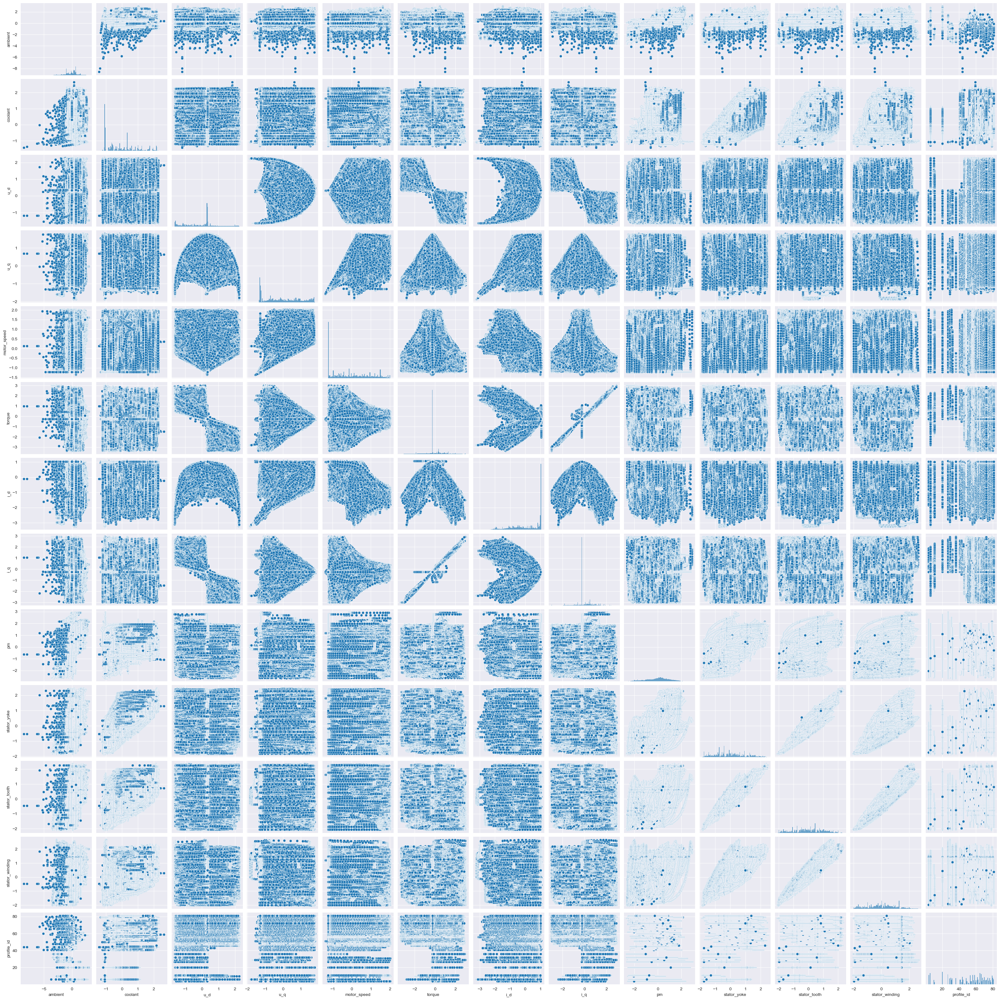

In [50]:
#Format the plot background and scatter plots for all the variables
sns.set_style(style='darkgrid')
sns.pairplot(new_df1)

# Claculating Variance Inflation Factor(VIF)

# To find out the collinearity probleam

In [51]:
rsq_ambient=smf.ols('ambient~coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_ambient)
vif_ambient=1/(1-rsq_ambient)

0.40782794249658816


In [52]:
rsq_coolant=smf.ols('coolant~ambient+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_coolant)
vif_coolant=1/(1-rsq_coolant)

0.9746225611344222


In [53]:
rsq_u_d=smf.ols('u_d~coolant+ambient+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_u_d)
vif_u_d=1/(1-rsq_u_d)

0.7862039877254697


In [54]:
rsq_u_q=smf.ols('u_q~coolant+u_d+ambient+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_u_q)
vif_u_q=1/(1-rsq_u_q)

0.3407480889428117


In [55]:
rsq_torque=smf.ols('torque~coolant+u_d+u_q+ambient+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_torque)
vif_torque=1/(1-rsq_torque)

0.9960156786774388


In [56]:
rsq_i_d=smf.ols('i_d~coolant+u_d+u_q+torque+ambient+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_i_d)
vif_i_d=1/(1-rsq_i_d)

0.66297815496077


In [57]:
rsq_i_q=smf.ols('i_q~coolant+u_d+u_q+torque+i_d+ambient+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_i_q)
vif_i_q=1/(1-rsq_i_q)

0.9955076324543831


In [58]:
rsq_pm=smf.ols('pm~coolant+u_d+u_q+torque+i_d+i_q+ambient+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_pm)
vif_pm=1/(1-rsq_pm)

0.7659155445606132


In [59]:
rsq_stator_yoke=smf.ols('stator_yoke~coolant+u_d+u_q+torque+i_d+i_q+pm+ambient+stator_tooth+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_stator_yoke)
vif_stator_yoke=1/(1-rsq_stator_yoke)

0.9972900599184059


In [60]:
rsq_stator_tooth=smf.ols('stator_tooth~coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+ambient+stator_winding+profile_id',data=new_df1).fit().rsquared
print(rsq_stator_tooth)
vif_stator_tooth=1/(1-rsq_stator_tooth)

0.9984413152356908


In [61]:
rsq_stator_winding=smf.ols('stator_winding~coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+ambient+profile_id',data=new_df1).fit().rsquared
print(rsq_stator_winding)
vif_stator_winding=1/(1-rsq_stator_winding)

0.9936214112584104


In [62]:
rsq_profile_id=smf.ols('profile_id~coolant+u_d+u_q+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+ambient',data=new_df1).fit().rsquared
print(rsq_profile_id)
vif_profile_id=1/(1-rsq_profile_id)

0.3563443487827477


In [63]:
# Storing vif values in a data frame
d1={'variables':['ambient','coolant','u_d','u_q','torque','i_d','i_q','pm','stator_yoke','stator_tooth','stator_winding','profile_id'],
    'VIF':[vif_ambient,vif_coolant,vif_u_d,vif_u_q,vif_torque,vif_i_d,vif_i_q,vif_pm,vif_stator_yoke,vif_stator_tooth,vif_stator_winding,vif_profile_id]}
vif_frame=pd.DataFrame(d1)
vif_frame
# VIf value >20 creating multicollinarity probleam

,variables,VIF
0,ambient,1.688698
1,coolant,39.405080
2,u_d,4.677356
3,u_q,1.516871
4,torque,250.983773
5,i_d,2.967167
6,i_q,222.599774
7,pm,4.271962
8,stator_yoke,369.011849
9,stator_tooth,641.566546


# Subset Selection

# AIC

In [64]:
# Build Model with coolant
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~coolant+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_coolant},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:658605.3842583694,rsq_wt:0.9746225611344222,rsquared:0.8870116116522301,rsquared_adj:0.8870108191977348'

In [65]:
# Build Model with i_q
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~i_q+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_i_q},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:428513.02188395243,rsq_wt:0.9955076324543831,rsquared:0.910275150822916,rsquared_adj:0.9102745215294009'

In [66]:
# Build Model with statpr_yoke
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~stator_yoke+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_stator_yoke},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:618431.1282538134,rsq_wt:0.9972900599184059,rsquared:0.891469296643333,rsquared_adj:0.891468535453223'

In [67]:
# Build Model with stator_tooth
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~stator_tooth+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_stator_tooth},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:590278.79234266,rsq_wt:0.9984413152356908,rsquared:0.8944878261493725,rsquared_adj:0.894487086129998'

In [68]:
# Build Model with stator_winding
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~stator_winding+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_stator_winding},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:540719.1964431559,rsq_wt:0.9936214112584104,rsquared:0.8995991265092402,rsquared_adj:0.8995984223384428'

In [69]:
# Build Model with torque
import statsmodels.formula.api as smf
model=smf.ols('motor_speed~torque+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_torque},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'
# This is the best model because low AIC value compare to other models

'AIC:420116.6970211789,rsq_wt:0.9960156786774388,rsquared:0.9110268005169053,rsquared_adj:0.9110261764951548'

In [70]:
#Build model for entire data
import statsmodels.formula.api as smf
model = smf.ols('motor_speed~ambient+coolant+u_d+u_q+motor_speed+torque+i_d+i_q+pm+stator_yoke+stator_tooth+stator_winding+profile_id',data=new_df1).fit()
f'AIC:{model.aic},rsq_wt:{rsq_torque},rsquared:{model.rsquared},rsquared_adj:{model.rsquared_adj}'

'AIC:-61984718.509143166,rsq_wt:0.9960156786774388,rsquared:1.0,rsquared_adj:1.0'

# Residual Analysis
# Model validation Techniques
# Test for Normality of Residuals (Q-Q Plot)

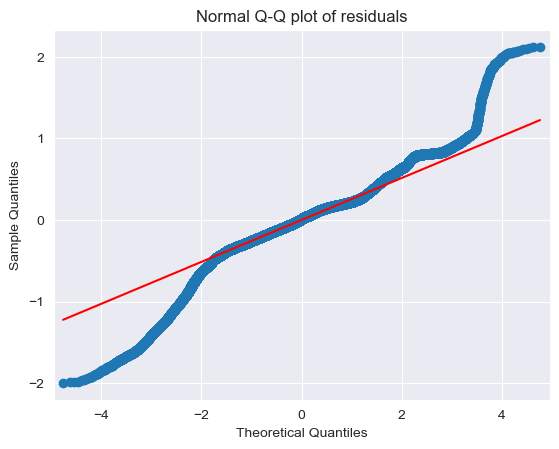

In [71]:
import statsmodels.api as sm
model=smf.ols('motor_speed~torque+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()
qqplot=sm.qqplot(model.resid,line='q')
plt.title("Normal Q-Q plot of residuals")
plt.show()

In [72]:
list(np.where(model.resid>2))

[array([420371, 420372, 420373, 420374, 420375, 420376, 420377, 420378,
        420379, 420380, 420381, 420382, 420383, 420384, 420385, 420386,
        424037, 424038, 424039, 424040, 424041, 424042, 424043, 424044,
        424045, 424046, 424047, 424048, 424049, 644155], dtype=int64)]

# Residual Plot for Homoscedasticity

In [73]:
model=smf.ols('motor_speed~torque+ambient+u_d+u_q+i_d+pm+profile_id',data=new_df1).fit()

In [74]:
def get_standardized_values(vals):
    return (vals-vals.mean())/vals.std()

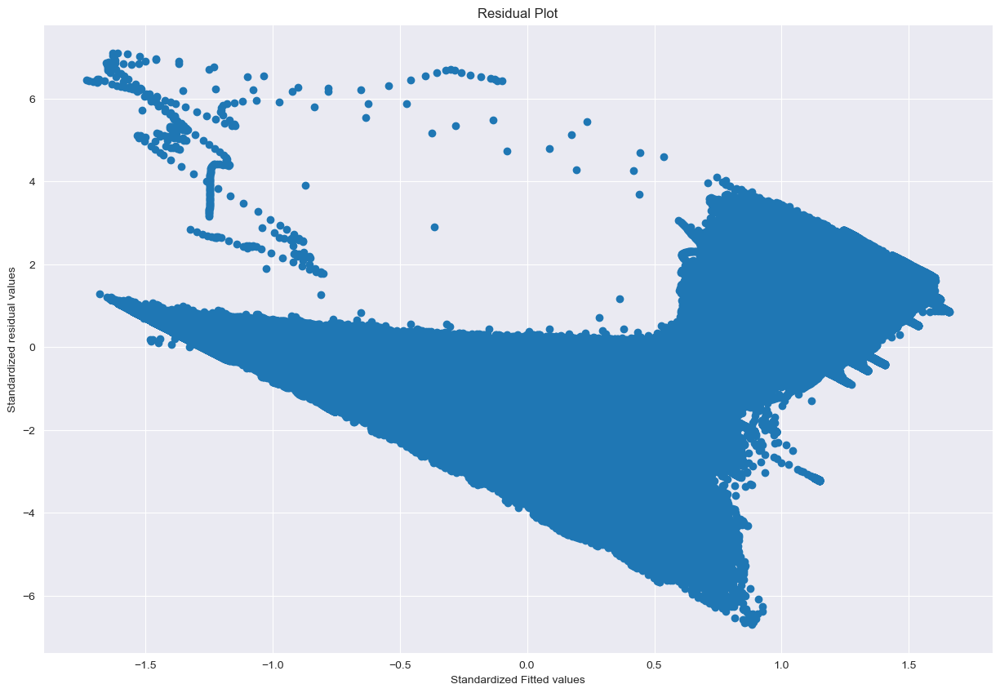

In [75]:
plt.figure(figsize=(15,10))
plt.scatter(get_standardized_values(model.fittedvalues),get_standardized_values(model.resid))
plt.title('Residual Plot')
plt.xlabel('Standardized Fitted values')
plt.ylabel('Standardized residual values')
plt.show()

# Residual Vs Regressors

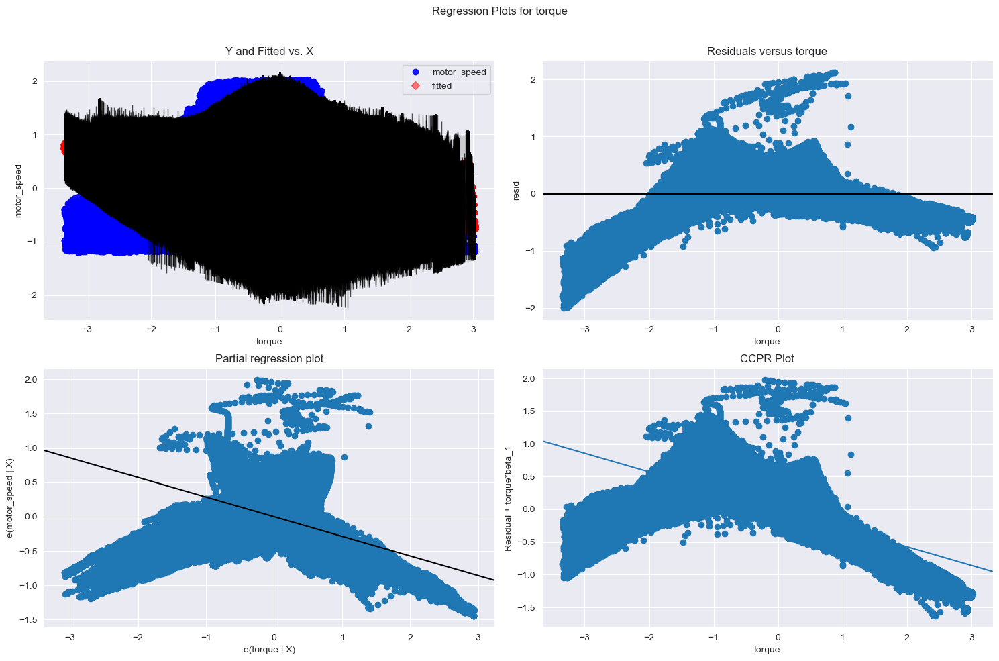

In [76]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"torque",fig=fig)
plt.show()
# CCPR - component plus residual plot
# A component residual plo adds a line indicating where the line of best fit lines
# A significant difference between the residual line and the component line
# indicates that the predictor does not have a linear relationship with the dependent variable.

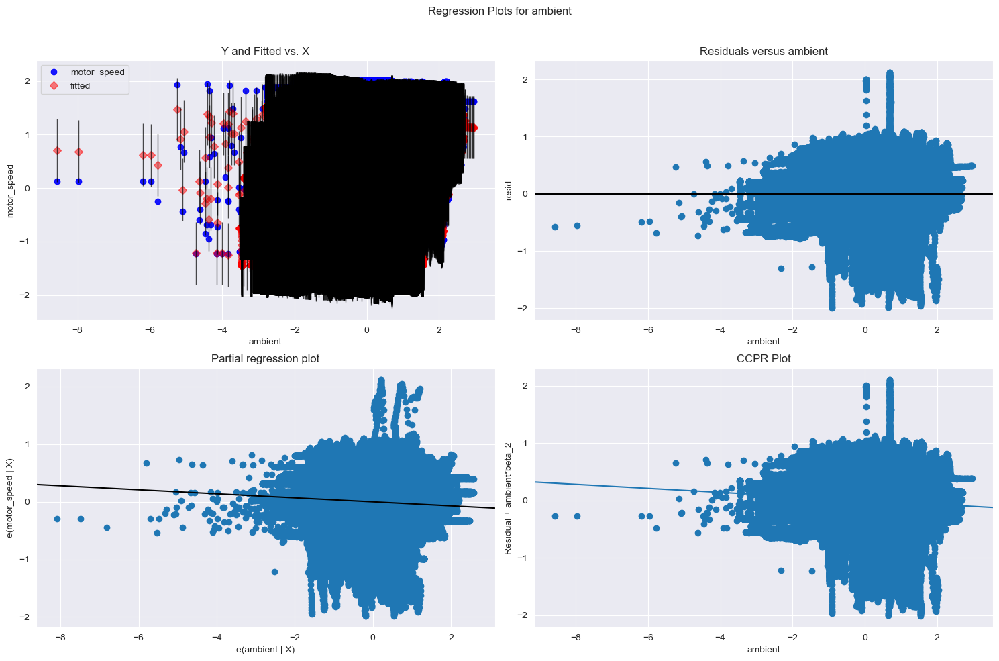

In [83]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"ambient",fig=fig)
plt.show()

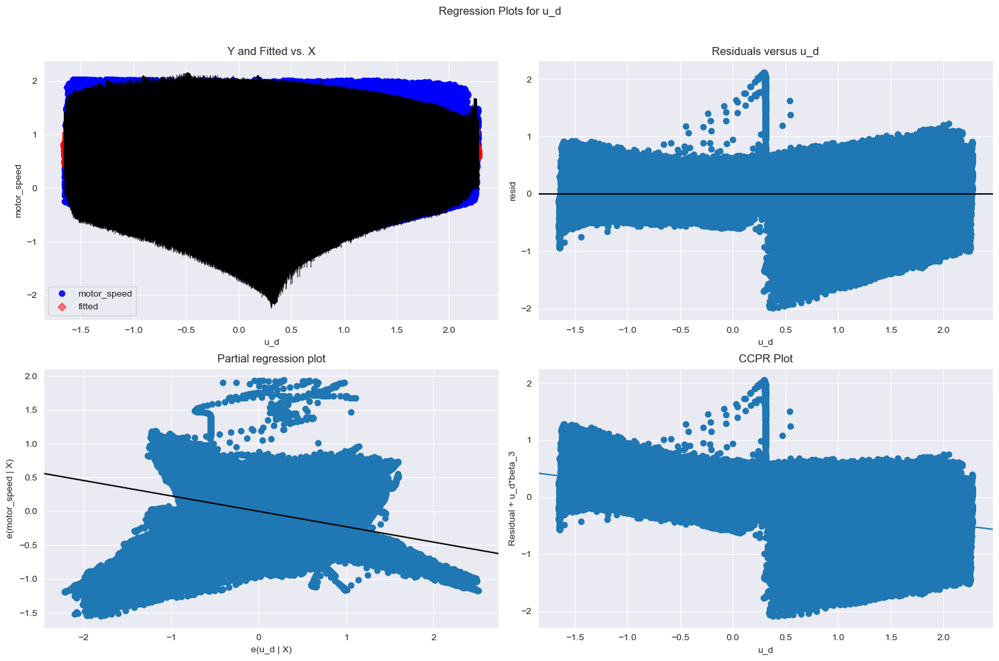

In [86]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"u_d",fig=fig)
plt.show()

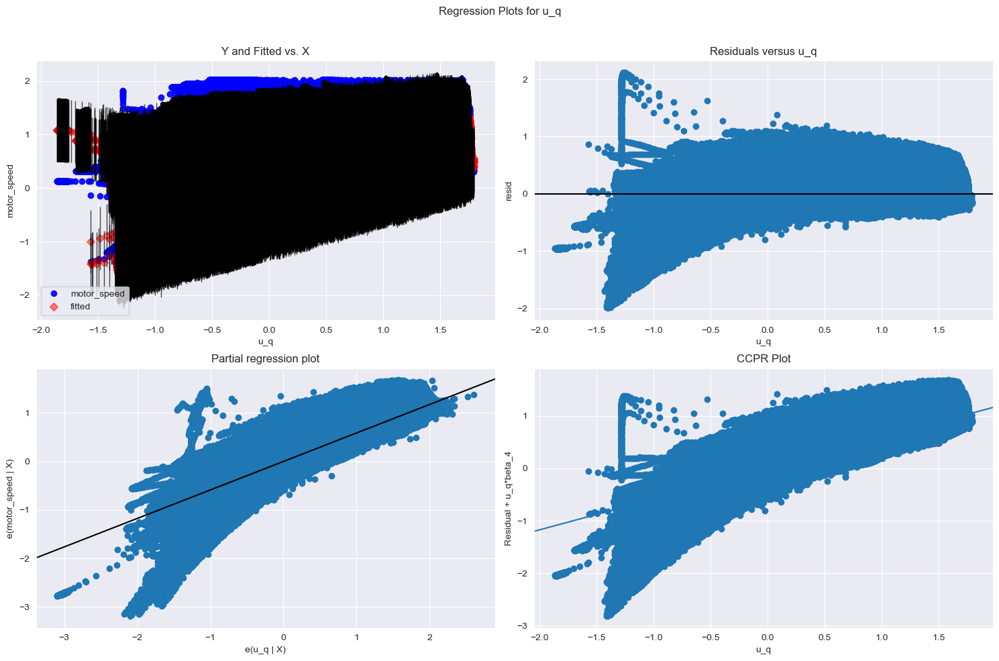

In [87]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"u_q",fig=fig)
plt.show()

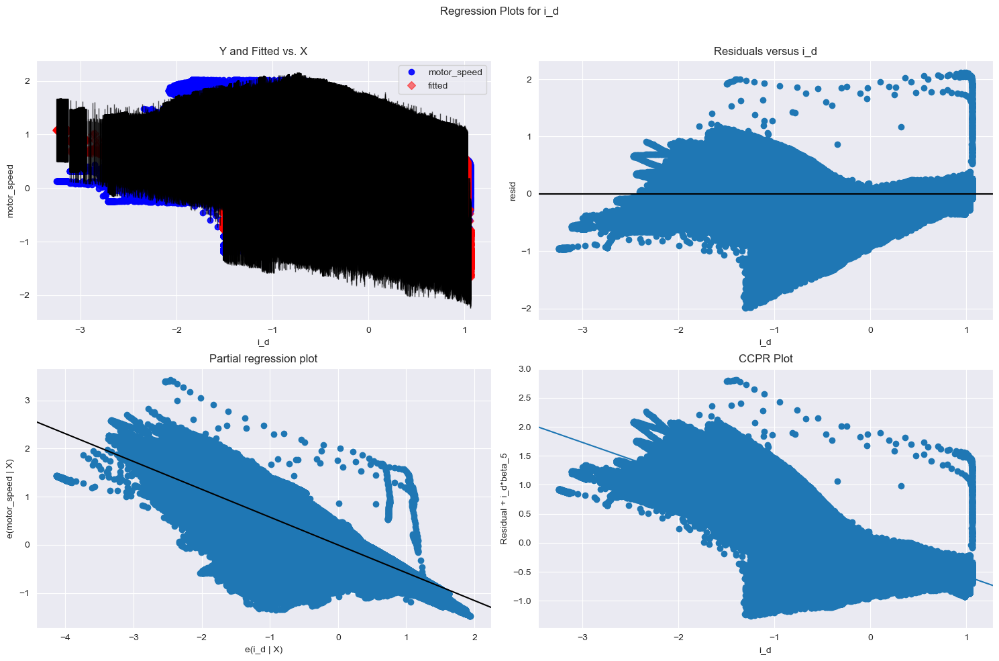

In [88]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"i_d",fig=fig)
plt.show()

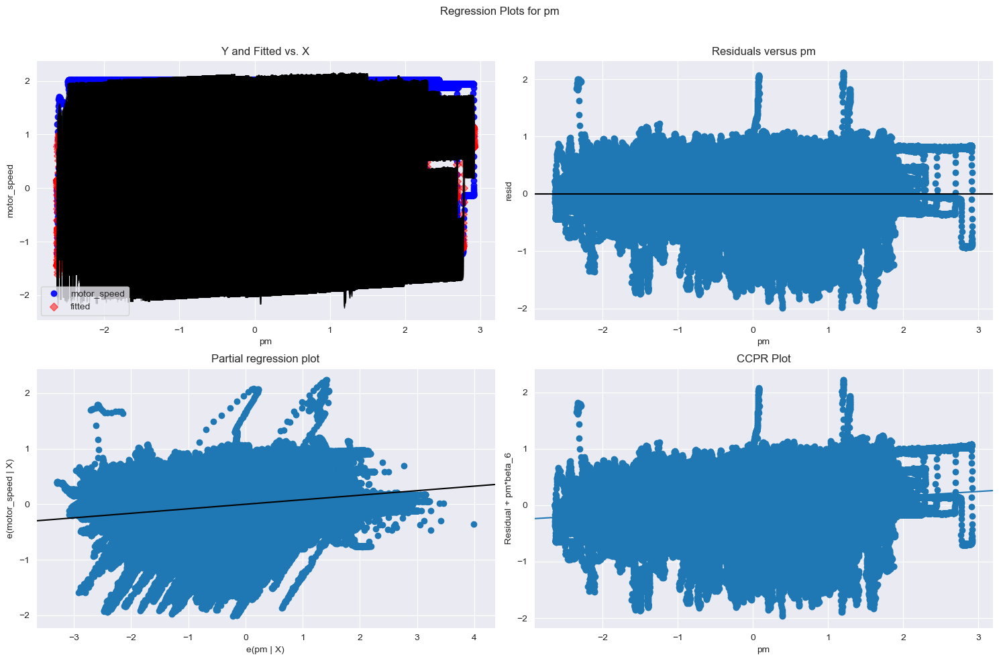

In [90]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"pm",fig=fig)
plt.show()

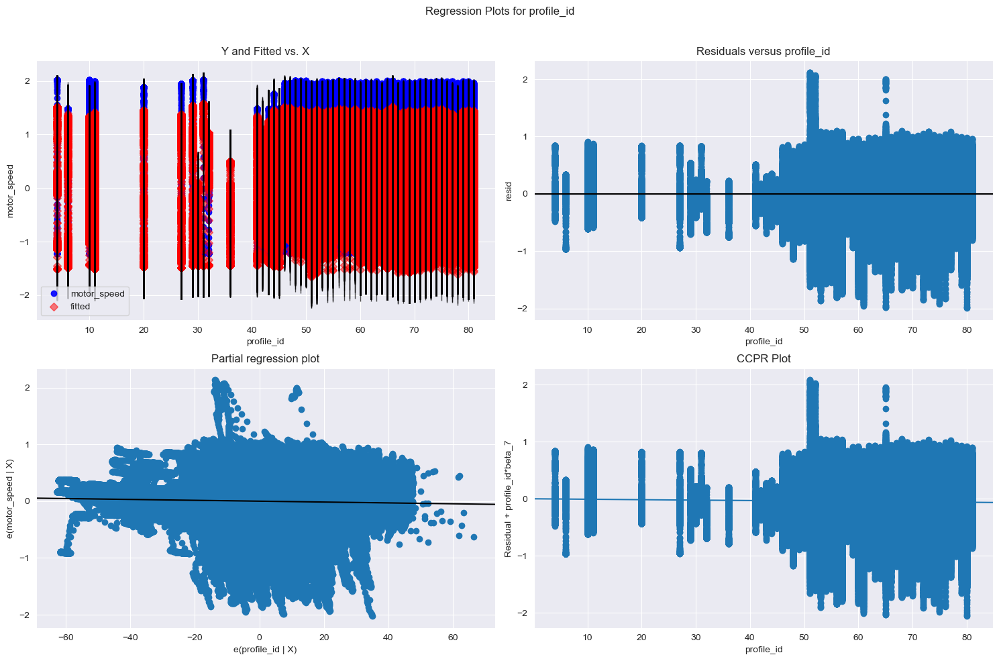

In [94]:
fig=plt.figure(figsize=(15,10))
fig=sm.graphics.plot_regress_exog(model,"profile_id",fig=fig)
plt.show()

# Model Deletion Diagnostice
# Detecting Influencers/Outliers

# Improving the model
# Cook's Distance

In [77]:
from statsmodels.graphics.regressionplots import influence_plot
model_influence=model.get_influence()
(c, _)=model_influence.cooks_distance # hear we get c values as well as c values probeality
c

array([1.62744389e-06, 1.61944691e-06, 1.64724166e-06, ...,
       4.76934695e-08, 4.95416647e-08, 4.74393935e-08])

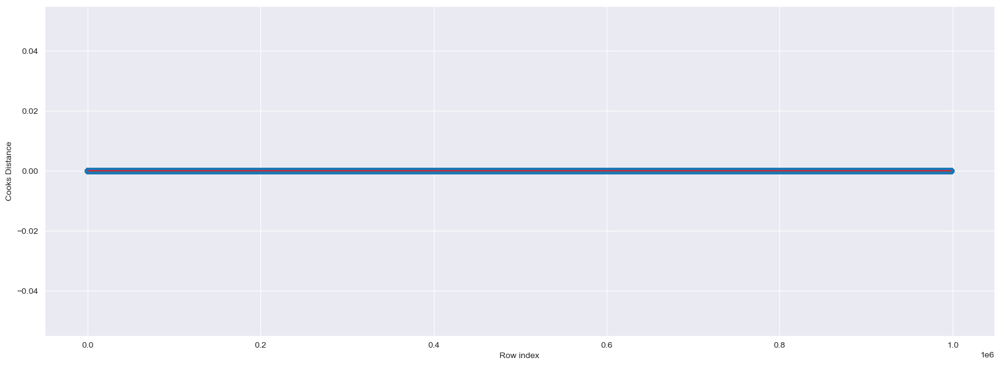

In [78]:
# Plot the influencers values using stem plot
fig=plt.subplots(figsize=(20,7))
plt.stem(np.arange(len(new_df1)),np.round(c,3))
plt.xlabel('Row index')
plt.ylabel('Cooks Distance')
plt.show()

In [98]:
new_df1.head()

,ambient,coolant,u_d,u_q,motor_speed,torque,i_d,i_q,pm,stator_yoke,stator_tooth,stator_winding,profile_id
0,-0.752143,-1.118446,0.327935,-1.297858,-1.222428,-0.250182,1.029572,-0.245860,-2.522071,-1.831422,-2.066143,-2.018033,4
1,-0.771263,-1.117021,0.329665,-1.297686,-1.222429,-0.249133,1.029509,-0.245832,-2.522418,-1.830969,-2.064859,-2.017631,4
2,-0.782892,-1.116681,0.332771,-1.301822,-1.222428,-0.249431,1.029448,-0.245818,-2.522673,-1.830400,-2.064073,-2.017343,4
3,-0.780935,-1.116764,0.333700,-1.301852,-1.222430,-0.248636,1.032845,-0.246955,-2.521639,-1.830333,-2.063137,-2.017632,4
4,-0.774043,-1.116775,0.335206,-1.303118,-1.222429,-0.248701,1.031807,-0.246610,-2.521900,-1.830498,-2.062795,-2.018145,4
